# **Setting Up the Environment**

In [26]:
from scipy.fftpack import dct
from scipy.fftpack import idct
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import math

# **Reading Images and Watermarks**

In [27]:
orig_color=cv2.imread("cover.jpg")
orig_grey=cv2.imread("lena.png")
wm_color=cv2.imread("iitbbs_logo.jpeg")
wm_grey=cv2.imread("logo.png")

# **Key Implementation Algorithm**

In [28]:
def ch_hx(c):
  a=ord(c)
  ls=format(a,'08b')
  ans_1=oct(int(ls[1:4],2))
  ans_2=oct(int(ls[5:],2))
  return int(ans_1,8),int(ans_2,8)

# **Watermark Embedding Algorithm using DCT coefficients**

In [29]:
def embedding(original_img,watermark,key):
  test=original_img[:,:,1]
  test=np.array(test,dtype=float).reshape((test.shape[0],test.shape[1]))
  size_1=int(test.shape[0]/8) * 8
  size_2=int(test.shape[1]/8) * 8
  wm_arry=np.array(watermark,dtype=float).reshape((watermark.shape[0],watermark.shape[1],3))
  wm_arry=wm_arry/255
  wm_flat=wm_arry.ravel()

  k=0
  z=0
  for i in range(0,size_1,8):
    for j in range(0,size_2,8):
      if(z>=(len(key))):
        z=0
      if(k<len(wm_flat)):
        test[i:i+8,j:j+8]=dct(dct(test[i:i+8,j:j+8].T, norm="ortho").T, norm="ortho")
        r,c=ch_hx(key[z])
        z=z+1
        test[i+r][j+c]=wm_flat[k]
        k=k+1
        test[i:i+8,j:j+8]=idct(idct(test[i:i+8,j:j+8].T, norm="ortho").T, norm="ortho")
      else:
        break
    if(k>=len(wm_flat)):
      break

  embed_img=np.zeros((test.shape[0],test.shape[1],3))
  embed_img[:,:,1]=test
  embed_img[:,:,0]=original_img[:,:,0]
  embed_img[:,:,2]=original_img[:,:,2]

  cv2.imwrite("WaterMarked_Image.jpeg",embed_img)

  return embed_img

# **Watermark Extracting Algorithm**

In [30]:
def extracting(water_marked_img,wm_size):
  ext_wm=[]
  k=0
  z=0
  size_1=int(water_marked_img.shape[0]/8) * 8
  size_2=int(water_marked_img.shape[1]/8) * 8
  test_1=water_marked_img[:,:,1]
  for i in range(0,size_1,8):
    for j in range(0,size_2,8):
      if(z>=(len(key))):
        z=0
      if(k<(wm_size[0]*wm_size[1]*3)):
        test_1[i:i+8,j:j+8]=dct(dct(test_1[i:i+8,j:j+8].T, norm="ortho").T, norm="ortho")
        r,c=ch_hx(key[z])
        z=z+1
        val=test_1[i+r][j+c]
        ext_wm.append(val)
        k=k+1
      else:
        break
    if(k>=(wm_size[0]*wm_size[1]*3)):
      break

  ext_wm=np.array(ext_wm,dtype=float).reshape((wm_size[0],wm_size[1],3))
  ext_wm=ext_wm*255
  ext_wm=ext_wm.astype(np.uint8)


  return ext_wm

# **Peak signal-to-noise ratio (PSNR) Function**

In [31]:
def PSNR(original, compressed):
    mse = np.mean((original - compressed) ** 2)
    if(mse == 0):  # MSE is zero means no noise is present in the signal .
                  # Therefore PSNR have no importance.
        return 100
    max_pixel = 255.0
    psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
    return psnr

# **User input function for choosing Cover Image and Watermark Image**

In [32]:
def user_input():
  cov_img=0
  wm_img=0
  while(cov_img!=1 and cov_img!=2):
    print("Choose Cover Image : ")
    print("1. Color Image\n2. GreyScale")
    cov_img=int(input())

  if(cov_img==1):
    orig=orig_color
  else:
    orig=orig_grey

  while(wm_img!=1 and wm_img!=2):
    print("Choose Watermark : ")
    print("1. Color watermark\n2. GreyScale")
    wm_img=int(input())

  if(wm_img==1):
    wm=wm_color
  else:
    wm=wm_grey

  return orig,wm

# **Normalized Cross-Correlation Index function**

In [33]:
def NC_ind(wm,ext_wm):
  nc_res = cv2.matchTemplate(wm,ext_wm,cv2.TM_CCORR_NORMED)
  return nc_res

# **Implementing the Embedding function**

Choose Cover Image : 
1. Color Image
2. GreyScale
1
Choose Watermark : 
1. Color watermark
2. GreyScale
1
Enter the Key: kuwuiw23
Original Image


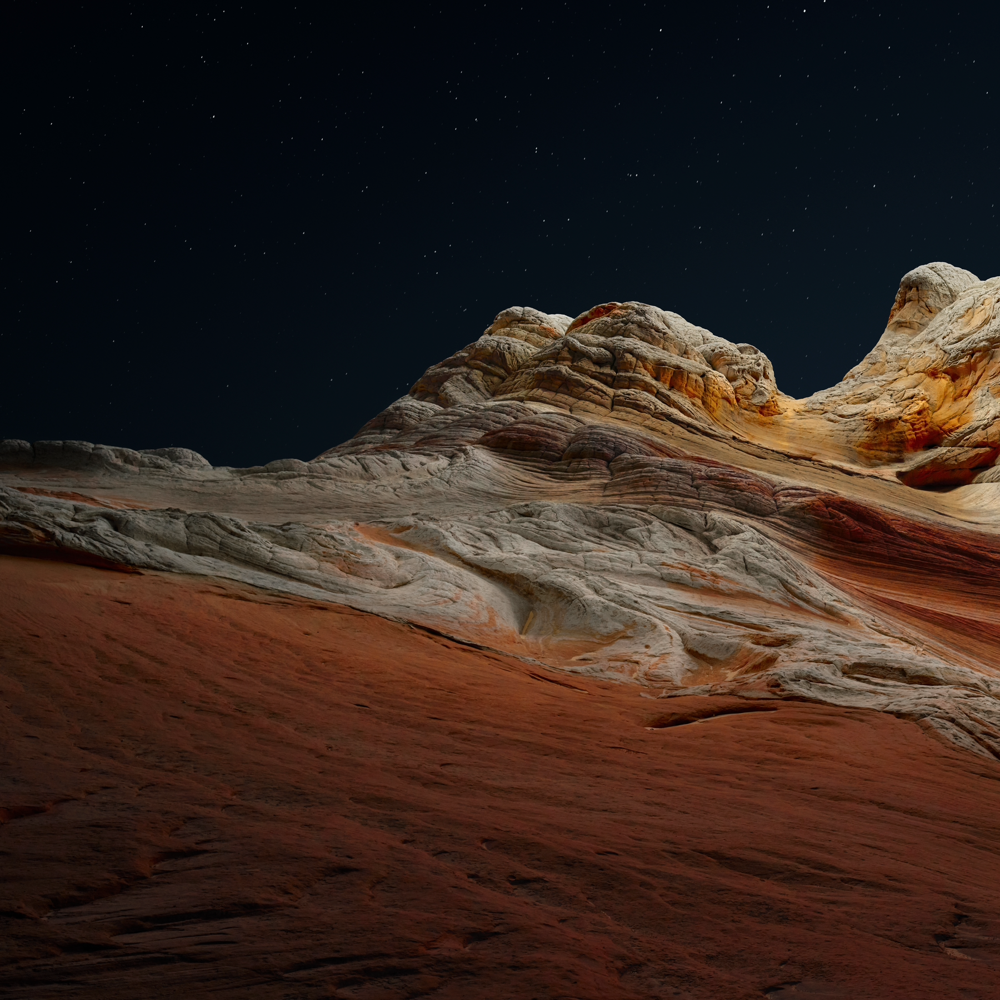


 

Watermarked Image


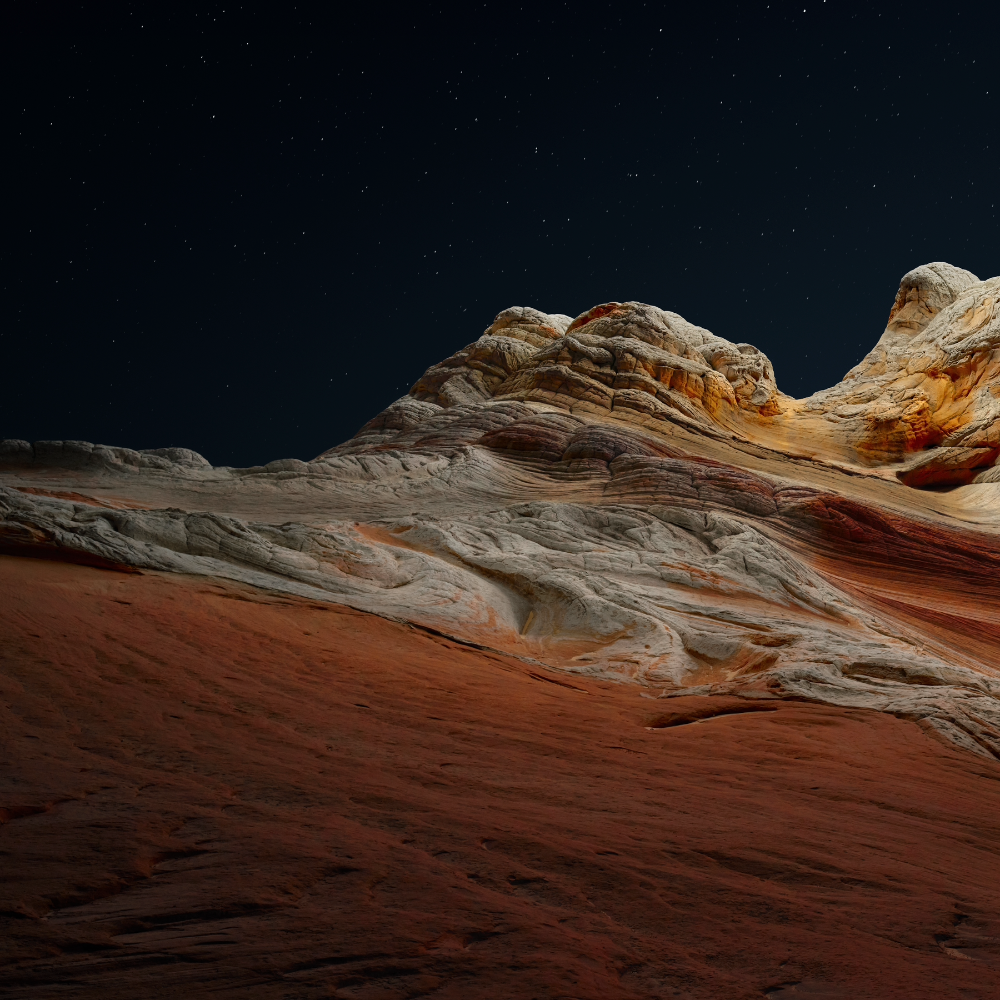

In [34]:
cover,watermark=user_input()
key=input("Enter the Key: ")
watermarked_img=embedding(cover,watermark,key)
print("Original Image")
cv2_imshow(cover)
print("\n \n")
print("Watermarked Image")
cv2_imshow(watermarked_img)

# **PSNR of original cover Image and watermarked image**

In [35]:
val=PSNR(cover,watermarked_img)
print("PSNR of orignal image vs watermarked image is : ",val)

PSNR of orignal image vs watermarked image is :  79.36928972335208


# **Implementing watermark extraction function**

In [36]:
extracted_wm=extracting(watermarked_img,[watermark.shape[0],watermark.shape[1],3])
print("Original Watermark")
cv2_imshow(watermark)
print("\n \n")
print("Extracted Watermark")
cv2_imshow(extracted_wm)

Original Watermark



 

Extracted Watermark


# **Printing the NCC index of original watermark and extracted watermark**

In [37]:
ncc_norm=NC_ind(watermark,extracted_wm)
print("Normalized cross-correlation (NC) index of extracted watermark image is : ", ncc_norm[0][0])

Normalized cross-correlation (NC) index of extracted watermark image is :  0.9999961


# **Defining Attack Functions**

In [38]:
def gauss_attack(img):
  r,c,ch= img.shape
  mean = 0
  var = 0.001
  sig = var**0.5
  noise = np.random.normal(mean,sig,(r,c,ch))
  noise = noise.reshape(r,c,ch)
  res = img + noise
  return res

        
def speckle_attack(img):
  r,c,ch = img.shape
  noise = np.random.randn(r,c,ch)        
  noise = noise.reshape(r,c,ch)         
  res = img + img * noise               
  return res



def rotate_attack(img):
  wd = img.shape[1]
  ht = img.shape[0]
  r_ang = np.deg2rad(90)  # angle in radians
  nw = (abs(np.sin(r_ang) * ht) + abs(np.cos(r_ang) * wd)) * 1.0
  nh = (abs(np.cos(r_ang) * ht) + abs(np.sin(r_ang) * wd)) * 1.0
  rot_mat = cv2.getRotationMatrix2D((nw * 0.5, nh * 0.5), 90, 1.0)
  rot_move = np.dot(rot_mat, np.array(
      [(nw - wd) * 0.5, (nh - ht) * 0.5, 0]))
  rot_mat[0, 2] += rot_move[0]
  rot_mat[1, 2] += rot_move[1]
  res=cv2.warpAffine(img, rot_mat, (int(math.ceil(nw)), int(math.ceil(nh))), flags=cv2.INTER_LANCZOS4)
  return res
        

def chop_attack(img):
  wd,ht=img.shape[:2]
  res=img[int(wd*0.5):,:]
  return res


# **Implementing Attack Functions**

In [ ]:
gauss_noise_img=gauss_attack(watermarked_img)
print("Attacked Image")
cv2_imshow(gauss_noise_img)
print("")
print("")
print("Extracted watermark from attacked image")
g_e_wm=extracting(gauss_noise_img,[watermark.shape[0],watermark.shape[1],3])
cv2_imshow(g_e_wm)

In [40]:
ncc_norm_wm1=NC_ind(watermark,g_e_wm)
print("Normalized cross-correlation (NC) index of extracted watermark image from attacked watermarked image is : ", ncc_norm_wm1[0][0])

Normalized cross-correlation (NC) index of extracted watermark image from attacked watermarked image is :  0.7754741


In [ ]:
speckle_noise_img=speckle_attack(watermarked_img)
print("Attacked Image")
cv2_imshow(speckle_noise_img)
print("")
print("")
print("Extracted Watermark from attacked image")
s_e_wm=extracting(speckle_noise_img,[watermark.shape[0],watermark.shape[1],3])
cv2_imshow(s_e_wm)

In [42]:
ncc_norm_wm2=NC_ind(watermark,s_e_wm)
print("Normalized cross-correlation (NC) index of extracted watermark image from attacked watermarked image is : ", ncc_norm_wm2[0][0])

Normalized cross-correlation (NC) index of extracted watermark image from attacked watermarked image is :  0.78540075


Attacked Image


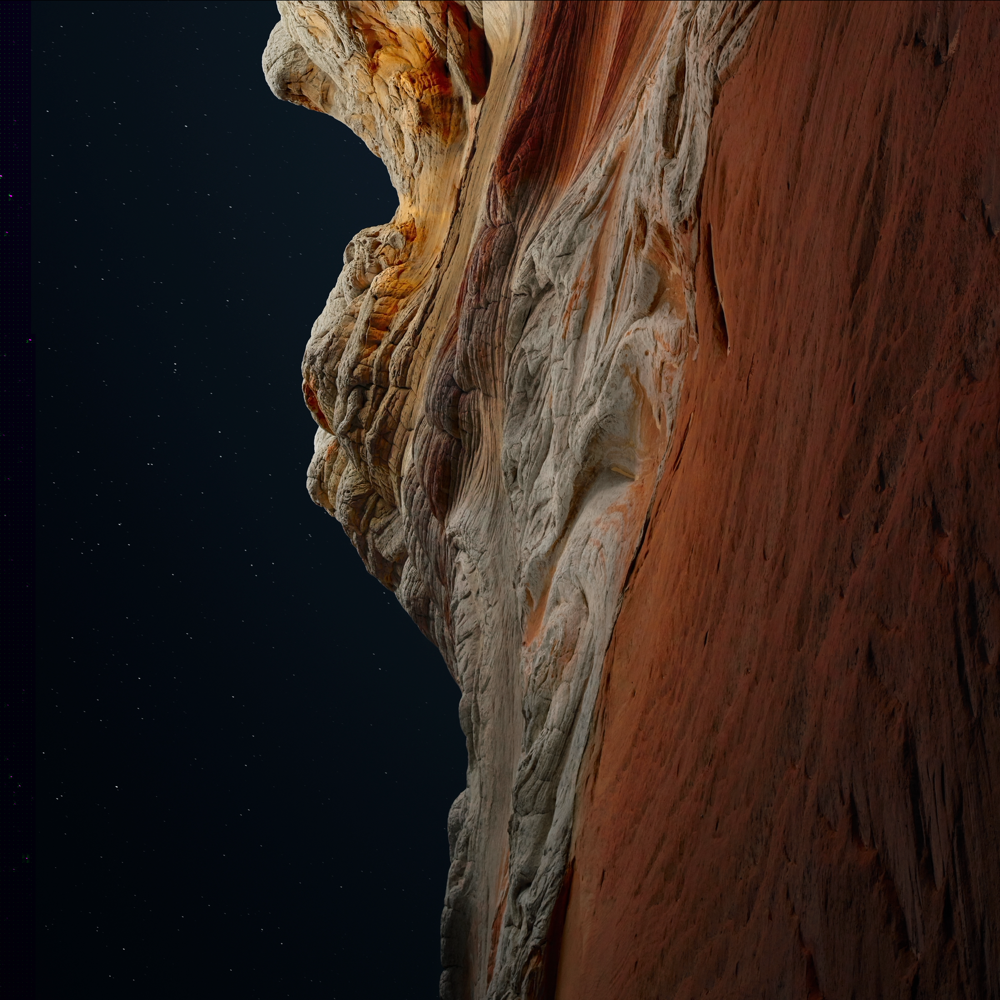



Extracted Watermark from attacked image


In [43]:
rotate_noise_img=rotate_attack(watermarked_img)
print("Attacked Image")
cv2_imshow(rotate_noise_img)
print("")
print("")
print("Extracted Watermark from attacked image")
r_e_wm=extracting(rotate_noise_img,[watermark.shape[0],watermark.shape[1],3])
cv2_imshow(r_e_wm)

In [44]:
ncc_norm_wm3=NC_ind(watermark,r_e_wm)
print("Normalized cross-correlation (NC) index of extracted watermark image from attacked watermarked image is : ", ncc_norm_wm3[0][0])

Normalized cross-correlation (NC) index of extracted watermark image from attacked watermarked image is :  0.7728049


Attacked Image


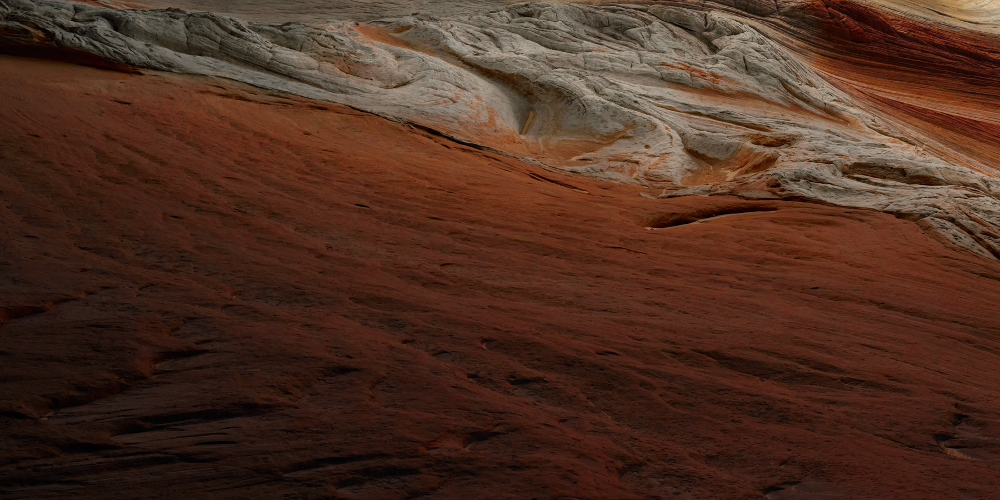



Extracted Watermark from attacked image


In [45]:
chop_noise_img=chop_attack(watermarked_img)
print("Attacked Image")
cv2_imshow(chop_noise_img)
print("")
print("")
print("Extracted Watermark from attacked image")
c_e_wm=extracting(chop_noise_img,[watermark.shape[0],watermark.shape[1],3])
cv2_imshow(c_e_wm)

In [46]:
ncc_norm_wm4=NC_ind(watermark,c_e_wm)
print("Normalized cross-correlation (NC) index of extracted watermark image from attacked watermarked image is : ", ncc_norm_wm4[0][0])

Normalized cross-correlation (NC) index of extracted watermark image from attacked watermarked image is :  0.78057826
